<b>Name : Jeon Hyun Min</b><br>
<b>Student id : 2014038304</b>

## Contents
- [1. Data Setting](#1.-Data-Setting)
- [2. Data Analysis](#2.-Data-Analysis)
- [3. Classifier Evaluation](#3.-Classifier-Evaluation)
- [4. Improvement](#4.-Improvement)
- [5. Conclusion](#5.-Conclusion)
- [6. Citation](#6.-Citation)

# 1. Data Setting

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
import seaborn as sns
%matplotlib inline

## Read data
- Load excel files by using Pandas
- Change excel files to csv files
- Csv files are faster than excel files when we read data

In [2]:
excel = pd.ExcelFile('breatcancer_expr.xlsx').parse(sheet_name=0, dtype=object, engine='xlrd', verbose=True)
excel.to_csv(path_or_buf='expr.csv', sep=',', header=True, index=False, mode='w', encoding='CP949')
expr = pd.read_csv('expr.csv', engine='c', sep=',', encoding='CP949')
excel = pd.ExcelFile('breatcancer_clinical.xlsx').parse(sheet_name=0, dtype=object, engine='xlrd', verbose=True)
excel.to_csv(path_or_buf='clinic.csv', sep=',', header=True, index=False, mode='w', encoding='CP949')
clinical = pd.read_csv('clinic.csv', engine='c', sep=',', encoding='CP949')

Reading sheet 0
Reading sheet 0


## Expr & clinical data
- expr : 19560 genes * 255 patients
- clinical : 362 patients * 25 features

In [3]:
expr

,genename,gsm282373,gsm282374,gsm282376,gsm282378,gsm282379,gsm282380,gsm282382,gsm282383,gsm282386,...,gsm107180,gsm107181,gsm107182,gsm107183,gsm107184,gsm107185,gsm107186,gsm107187,gsm107188,gsm107190
0,DDR1,10.830880,11.415693,11.102564,9.887807,11.070358,10.472188,10.470059,10.435266,10.521953,...,11.284514,10.447881,10.530046,10.884212,10.254828,10.670846,8.786126,10.661680,10.703359,10.518693
1,RFC2,6.537210,6.520366,6.582786,7.093003,6.581049,6.968399,6.539901,7.011500,6.997391,...,6.370906,6.571489,6.422459,6.878336,6.380203,6.331382,6.419317,6.192183,6.401563,5.951992
2,HSPA6,7.277863,7.316761,7.279104,7.286577,7.519710,7.450327,6.911198,7.405124,7.516294,...,7.795050,7.390194,7.325931,7.585992,7.586850,7.549852,7.488433,8.141492,7.345247,7.492094
3,PAX8,9.740926,9.645825,9.859698,9.319635,9.287543,9.320164,9.241064,9.204484,9.509921,...,9.996307,10.113618,10.453775,10.462783,10.478436,10.305541,10.224340,10.393858,10.358396,10.062984
4,GUCA1A,5.267913,5.116714,5.090731,5.085679,5.177971,5.162901,5.115369,5.092952,5.125900,...,5.353165,5.217218,5.079343,5.189899,5.185406,5.210108,5.133257,5.156300,5.106015,5.164850
5,UBA7,7.382774,8.207070,7.999345,8.332940,7.973080,8.404620,8.965162,8.335589,8.230214,...,8.891930,8.673717,8.398126,8.629055,8.286952,8.564053,8.408743,8.518770,8.112828,8.750865
6,THRA,8.588972,7.527786,7.167136,6.756487,6.754006,6.875168,6.857968,6.424208,6.529795,...,6.699138,6.967785,6.997430,6.944340,7.016561,6.878009,7.074283,7.231131,7.022459,6.874598
7,PTPN21,5.464588,5.451635,5.364455,5.629505,5.398641,5.479559,5.604647,5.533351,5.436901,...,5.607851,5.464508,5.638194,5.517552,5.494902,5.419334,5.492560,5.337967,5.395941,5.332411
8,CCL5,6.818210,6.455215,7.515767,7.939541,9.130576,11.488967,8.029570,8.353438,7.595918,...,6.879420,9.597780,8.763666,10.755246,7.866868,8.381739,9.239285,10.513156,7.577351,10.543355
9,CYP2E1,5.530614,5.403731,5.422672,5.503958,5.434248,5.421964,5.765752,5.442480,5.493136,...,5.547605,5.451208,5.377427,5.549791,5.300293,5.420838,5.521540,5.434187,5.443222,5.396343


In [4]:
clinical

,gsm,dataset,sample.id,cohort,treatment,node.status,er.status,age,stage,size,...,time.mfi,time.dmfs,time.dss,event.rfs,event.drfs,event.os,event.dfs,event.mfi,event.dmfs,event.dss
0,gsm282373,gse11121,BC6001_r,Mainz,none,False,False,53.926027,1.0,1.8,...,7.660000,NaN,NaN,True,NaN,True,NaN,True,NaN,NaN
1,gsm282374,gse11121,BC6002_r,Mainz,none,False,True,54.375343,2.0,2.5,...,7.851667,NaN,NaN,False,NaN,False,NaN,False,NaN,NaN
2,gsm282376,gse11121,BC6004_r,Mainz,none,False,True,71.260274,1.0,1.2,...,5.706667,NaN,NaN,True,NaN,True,NaN,False,NaN,NaN
3,gsm282378,gse11121,BC6006,Mainz,none,False,True,60.684931,1.0,1.8,...,7.783333,NaN,NaN,False,NaN,False,NaN,False,NaN,NaN
4,gsm282379,gse11121,BC6007,Mainz,none,False,True,60.120548,1.0,1.4,...,9.265833,NaN,NaN,False,NaN,False,NaN,False,NaN,NaN
5,gsm282380,gse11121,BC6008,Mainz,none,False,True,63.857534,1.0,1.3,...,8.759167,NaN,NaN,False,NaN,False,NaN,False,NaN,NaN
6,gsm282382,gse11121,BC6011,Mainz,none,False,True,72.495890,1.0,1.6,...,6.783333,NaN,NaN,False,NaN,False,NaN,False,NaN,NaN
7,gsm282383,gse11121,BC6012,Mainz,none,False,True,56.375343,1.0,1.4,...,6.564167,NaN,NaN,False,NaN,False,NaN,False,NaN,NaN
8,gsm282386,gse11121,BC6015,Mainz,none,False,True,69.265753,2.0,2.3,...,6.991667,NaN,NaN,False,NaN,False,NaN,False,NaN,NaN
9,gsm282391,gse11121,BC6021,Mainz,none,False,True,65.824658,2.0,4.4,...,7.745000,NaN,NaN,False,NaN,False,NaN,False,NaN,NaN


## Make data sets
- We should use expr datas to classify patients' grade
- We can use expr datas of <b>255 patients</b>
- Some patients has 'NA' grade in clinical data
- Make 'labels' data set using 'grade' of clinical data
- Make 'data' data set using genes of expr data
- Except patients who have 'NA' grade

### About 'NA' data
- Deletion of NA data can cause bias
- Not delete features but just <b>9 patients</b> datas
- It will not cause big bias

In [5]:
labels = []
for i in range(255):
    if not pd.isna(clinical['grade'][i]):
        labels.append(clinical['grade'][i])
data = []
for i in range(255):
    if not pd.isna(clinical['grade'][i]):
        arr = list(expr[expr.columns[i+1]])
        data.append(arr)
print(len(labels), len(data))

246 246


## Split train set & test set
- We got <b>246 datas</b> (label & genes)
- Split <b>220 train</b> set & <b>26 test</b> set

In [6]:
x_train = np.array(data[0:220])
y_train = np.array(labels[0:220])
x_test = np.array(data[220:])
y_test = np.array(labels[220:])

## Standardization
- Use StandardScaler
- Standardize train data & test data

In [7]:
sc = StandardScaler()
sc.fit(x_train)
x_train_std = sc.transform(x_train)
x_test_std = sc.transform(x_test)

## PCA
- We have 19560 features
- Too many features disturb learning
- To reduce features, use PCA
- About <b>200 features</b> can represent most information

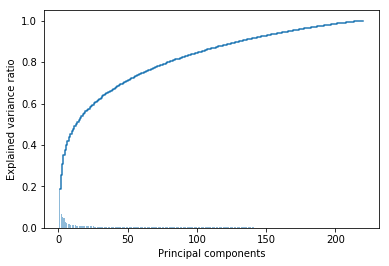

In [8]:
pca = PCA()
x_train_pca = pca.fit_transform(x_train_std)
plt.bar(range(1, 221), pca.explained_variance_ratio_, alpha=0.5, align='center')
plt.step(range(1, 221), np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')
plt.show()

## Split patients by grades
- <b>'g1'</b> has index of patients who has <b>grade1</b>

In [9]:
g1 = []
g2 = []
g3 = []
for i in range(255):
    if clinical['grade'][i] == 1:
        g1.append(i)
    elif clinical['grade'][i] == 2:
        g2.append(i)
    elif clinical['grade'][i] == 3:
        g3.append(i)

## Group patients' gene data by genes
- <b>'genes[0]'</b> means <b>'DDR1'</b> values of <b>255 patients</b>
- We use <b>246 patients' data</b>, but using patients who has <b>'NA' grade</b> is possible for analysis <b>distribution</b> of datas

In [10]:
genes = []
for i in range(19560):
    genes.append(list(expr.loc[i][1:]))

## Calculate means of genes by grades
- <b>'g1_means[0]'</b> means <b>mean</b> of <b>'DDR1'</b> values of patients who has <b>grade1</b>

## Calculate difference of means in each gene
- <b>'diff[0]'</b> means ( mean of <b>grade3</b> - mean of <b>grade1</b> ) in <b>'DDR1'</b>
- <b>'diff2[0]'</b> means ( mean of <b>grade2</b> - mean of <b>grade1</b> ) in <b>'DDR1'</b>

In [11]:
g1_means = []
g2_means = []
g3_means = []
diff = []
diff2 = []
for i in genes:
    g1_sum = 0
    g2_sum = 0
    g3_sum = 0
    for j in g1:
        g1_sum += i[j]
    for j in g2:
        g2_sum += i[j]
    for j in g3:
        g3_sum += i[j]
    g1_means.append(g1_sum/len(g1))
    g2_means.append(g2_sum/len(g2))
    g3_means.append(g3_sum/len(g3))
    diff.append(abs(g3_sum/len(g3)-g1_sum/len(g1)))
    diff2.append(abs(g2_sum/len(g2)-g1_sum/len(g1)))

## Calculate variance of genes by grades
- <b>'g1_var[0]'</b> means <b>variance</b> of <b>'DDR1'</b> values of patients who has <b>grade1</b>
- <b>'var_sum[0]'</b> means <b>sum</b> of <b>variance</b> of <b>'DDR1'</b> ( g1_var[0] + g2_var[0] + g3_var[0] )

In [12]:
g1_var = []
g2_var = []
g3_var = []
var_sum = []
for i in genes:
    s = 0
    temp = []
    for j in g1:
        temp.append(i[j])
    g1_var.append(np.var(temp))
    s += np.var(temp)
    temp = []
    for j in g2:
        temp.append(i[j])
    g2_var.append(np.var(temp))
    s += np.var(temp)
    temp = []
    for j in g3:
        temp.append(i[j])
    g3_var.append(np.var(temp))
    s += np.var(temp)
    var_sum.append(s)

# 2. Data Analysis

## Visualization function
- hist : draw histogram & show <b>distribution</b> of a gene
- plot : draw plots & show <b>distribution</b> of a gene by <b>grades</b>
- plot_mean : draw plots & show <b>means</b> of a gene by <b>grades</b>

In [13]:
def hist(g):
    x = list(expr.loc[g][1:])
    plt.title("{0} {1}".format(expr.loc[g][0],g))
    plt.hist(x,bins=30)
    plt.show()
def plot(g):
    x = []
    y = []
    for i in range(255):
        if not pd.isna(clinical['grade'][i]):
            x.append(clinical['grade'][i])
            y.append(expr.loc[g][i+1])
    plt.plot(x,y,'o')
    plt.xlabel("grade")
    plt.ylabel("{0} {1}".format(expr.loc[g][0], g))
    plt.show()
def plot_mean(g):
    grades = [1, 2, 3]
    means = []
    means.append(g1_means[g])
    means.append(g2_means[g])
    means.append(g3_means[g])
    plt.plot(grades, means, 'o')
    plt.xlabel("grade")
    plt.ylabel("{0} {1}".format(expr.loc[g][0], g))
    plt.show()
def heatmap(pred, label):
    met = [[0, 0, 0],[0, 0, 0],[0, 0, 0]]
    met_r = [[0, 0, 0],[0, 0, 0],[0, 0, 0]]
    for i in range(len(pred)):
        if pred[i]==1:
            if label[i]==1: met[0][0]+=1
            elif label[i]==2: met[1][0]+=1
            else: met[2][0]+=1
        elif pred[i]==2:
            if label[i]==1: met[0][1]+=1
            elif label[i]==2: met[1][1]+=1
            else: met[2][1]+=1
        else:
            if label[i]==1: met[0][2]+=1
            elif label[i]==2: met[1][2]+=1
            else: met[2][2]+=1
    for i in range(len(met)):
        tot = 0
        for j in met[i]:
            tot+=j
        for j in range(len(met[i])):
            met_r[i][j]+=met[i][j]/tot
    plt.figure(figsize=(5,4))
    sns.heatmap(met_r,xticklabels="123",yticklabels="123",annot=True,fmt=".2f",cmap="Blues")
    plt.xlabel("Predict")
    plt.ylabel("True")
    plt.show()

## Sort genes by difference of mean & variance
- Sort 'diff' => We can know <b>which genes</b> have <b>distinguishable</b> <b>means</b> by <b>grades</b>
- Sort 'var_sum' => We can know <b>which genes</b> have <b>small</b> <b>variance</b> by <b>grades</b>

In [14]:
diff = np.array(diff)
diff_sort = np.argsort(-diff)
diff2 = np.array(diff2)
var_sum = np.array(var_sum)
var_sort = np.argsort(var_sum)

## Visualize datas
- <b>200 features(genes)</b> are proper to represent information (by <b>PCA</b>)
- So, visualize <b>200</b> <b>sorted</b> genes

## 200 genes that have small variance by grades
### Distribution of 200 genes by grades
- We can see <b>genes</b> of patients who have <b>grade2</b> are <b>spread widely</b>
- It looks <b>difficult</b> to use <b>variance</b> of genes
- It is <b>ambiguous</b> to <b>sort</b> or to <b>set threshold</b> by <b>variance</b> of genes
- Because we have <b>small</b> <b>data</b> set (just <b>246</b> data)

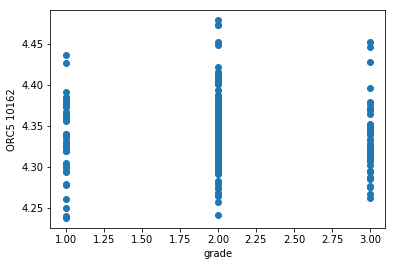

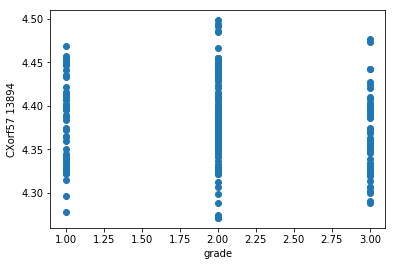

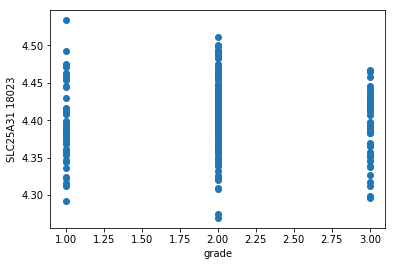

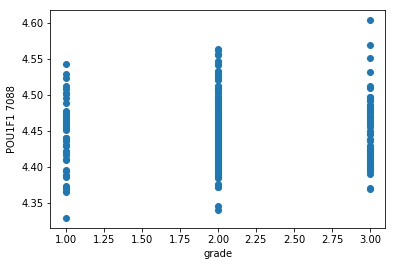

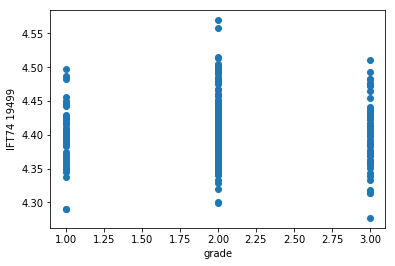

...

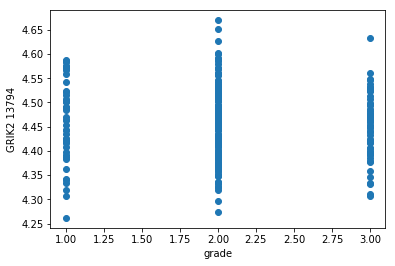

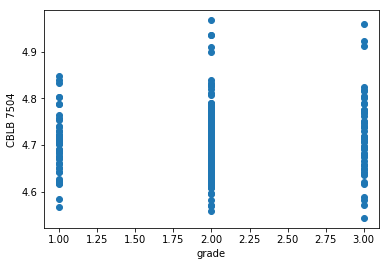

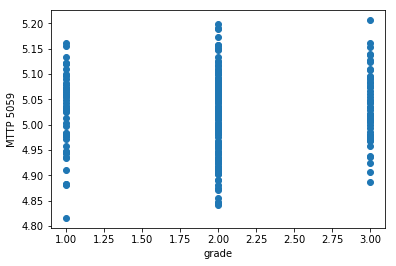

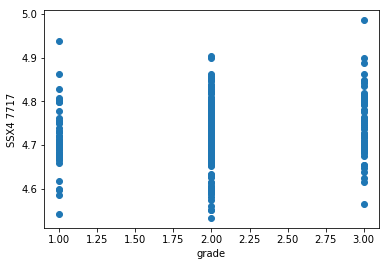

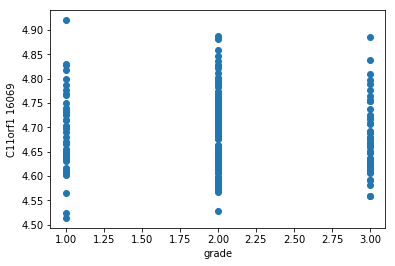

In [15]:
for i in var_sort[0:200]:
    plot(i)

## 200 genes that have distinguishable means between grade1 and grade3
### Distribution of 200 genes by grades
- We can see genes of patients who have <b>grade2</b> are <b>spread widely</b> as we saw above
- There is <b>high</b> probablity of <b>misclassification</b> (<b>grade1</b> or <b>grade3</b> => <b>grade2</b>)

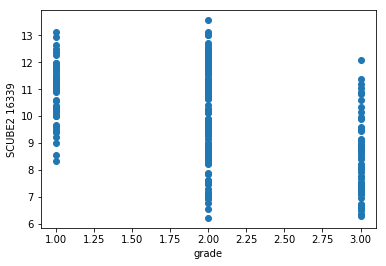

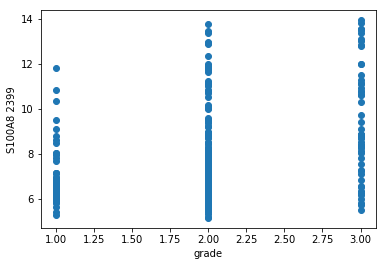

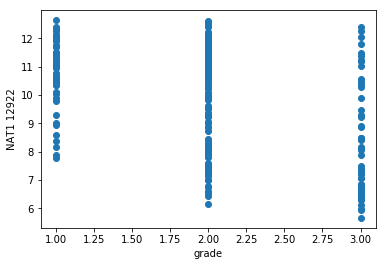

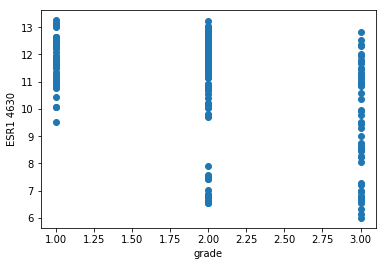

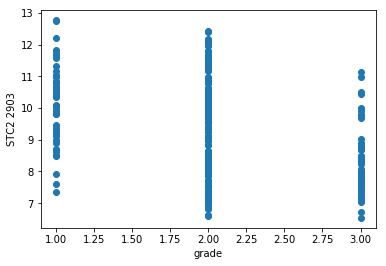

...

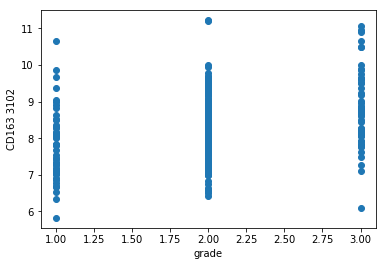

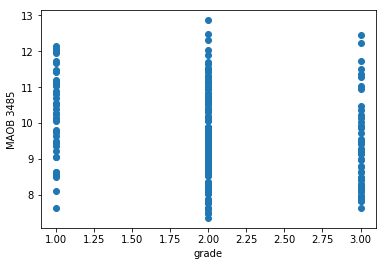

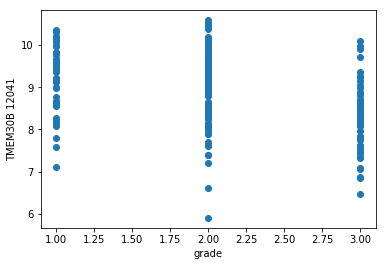

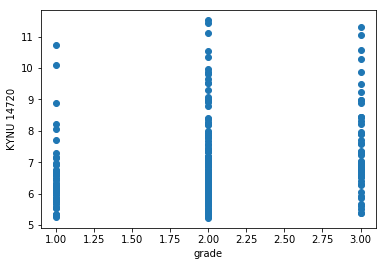

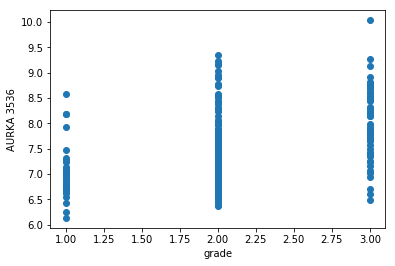

In [16]:
for i in diff_sort[0:200]:
    plot(i)

### Means of 200 genes by grades
- It looks <b>easy</b> to classify <b>grade1</b> or <b>grade3</b>
- But it looks <b>difficult</b> to classify <b>grade1</b> or <b>grade2</b>

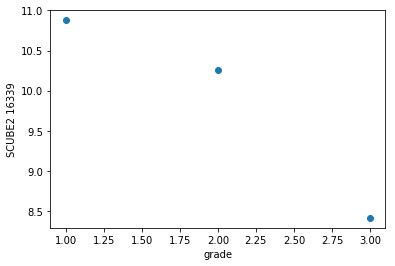

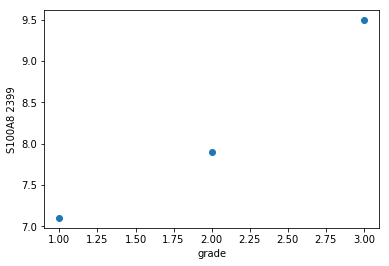

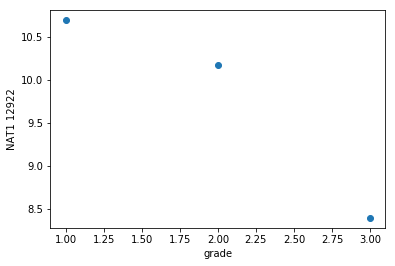

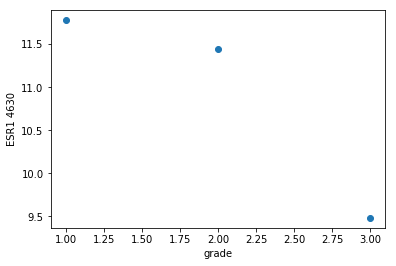

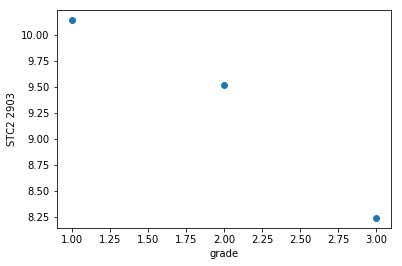

...

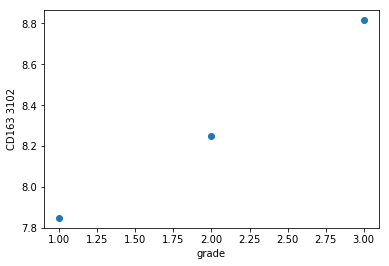

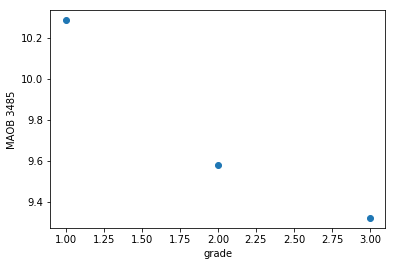

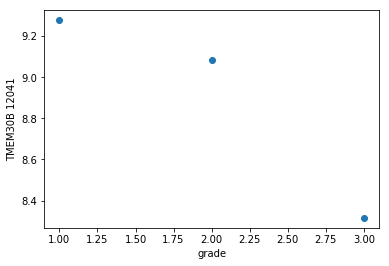

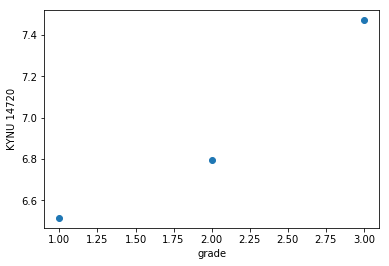

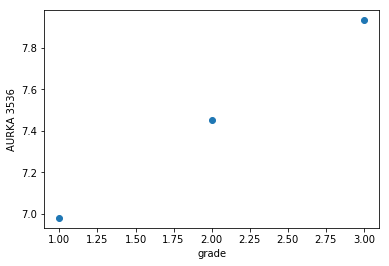

In [17]:
for i in diff_sort[0:200]:
    plot_mean(i)

# 3. Classifier Evaluation
## Set feature(genes) by sorted genes
- Use <b>means</b> of genes during <b>sorting</b>, not variance

In [18]:
features = diff_sort[0:200]

## Remake data set using 200 features(genes)
- We reduced <b>19560</b> features(genes) to <b>200</b>
- Make data set & split & standardize again

In [19]:
data = []
for i in range(255):
    if not pd.isna(clinical['grade'][i]):
        arr = list(expr[expr.columns[i+1]][features])
        data.append(arr)

In [20]:
x_train = np.array(data[0:220])
y_train = np.array(labels[0:220])
x_test = np.array(data[220:])
y_test = np.array(labels[220:])

In [21]:
sc = StandardScaler()
sc.fit(x_train)
x_train_std = sc.transform(x_train)
x_test_std = sc.transform(x_test)

## Classifiers
- [Logistic Regression](#Logistic-Regression)
- [KNN](#KNN)
- [SVM](#SVM)
- [Random Forest](#Random-Forest)
- [Decision Tree](#Decision-Tree)
- [Bagging](#Bagging)
- [Ada Boost](#Ada-Boost)

### Logistic Regression

C:\Users\jeon\AppData\Local\Programs\Python\Python36-32\Lib\conda\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
C:\Users\jeon\AppData\Local\Programs\Python\Python36-32\Lib\conda\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\jeon\AppData\Local\Programs\Python\Python36-32\Lib\conda\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\jeon\AppData\Local\Programs\Python\Python36-32\Lib\conda\lib\site-packages\sklearn\linear_model\logistic.py:433: Future

Train :  0.6545454545454545
{'C': 0.1}
Test :  0.46153846153846156


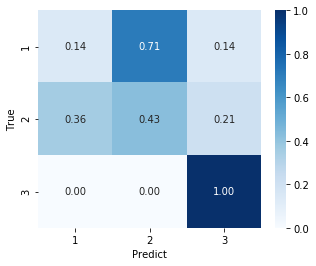

In [22]:
lr = LogisticRegression(random_state=1)
param_range = [0.001, 0.01, 0.1, 1.0, 10.0, 100.0 ,1000.0]
param_grid = [{'C': param_range}]
gs = GridSearchCV(estimator=lr, param_grid=param_grid, scoring='accuracy', cv=10, n_jobs=-1)
gs = gs.fit(x_train_std, y_train)

print("Train : ",gs.best_score_)
print(gs.best_params_)

lr = LogisticRegression(C=0.1, random_state=1)
lr.fit(x_train_std, y_train)
pred = lr.predict(x_test_std)
print("Test : ",accuracy_score(pred, y_test))
heatmap(pred,y_test)

### KNN

C:\Users\jeon\AppData\Local\Programs\Python\Python36-32\Lib\conda\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Train :  0.6227272727272727
{'n_neighbors': 4}
Test :  0.5769230769230769


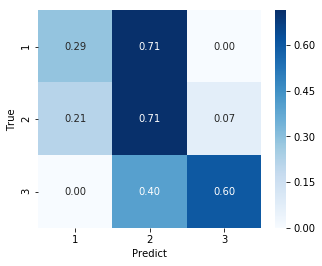

In [23]:
knn = KNeighborsClassifier()
param_range = [2, 3, 4, 5]
param_grid = [{'n_neighbors': param_range}]
gs = GridSearchCV(estimator=knn, param_grid=param_grid, scoring='accuracy', cv=10, n_jobs=-1)
gs = gs.fit(x_train_std, y_train)

print("Train : ",gs.best_score_)
print(gs.best_params_)

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(x_train_std, y_train)
pred = knn.predict(x_test_std)
print("Test : ",accuracy_score(pred, y_test))
heatmap(pred,y_test)

### SVM

C:\Users\jeon\AppData\Local\Programs\Python\Python36-32\Lib\conda\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Train :  0.6909090909090909
{'C': 10.0, 'gamma': 0.001, 'kernel': 'rbf'}
Test :  0.6538461538461539


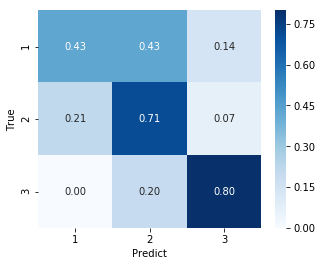

In [24]:
svm = SVC(random_state=1)
param_range = [0.001, 0.01, 0.1, 1.0, 10.0, 100.0 ,1000.0]
param_grid = [{'C': param_range, 'gamma': param_range, 'kernel': ['rbf']},
             {'C': param_range, 'kernel': ['poly'], 'gamma': param_range}]
gs = GridSearchCV(estimator=svm, param_grid=param_grid, scoring='accuracy', cv=10, n_jobs=-1)
gs = gs.fit(x_train_std, y_train)

print("Train : ",gs.best_score_)
print(gs.best_params_)

svm = SVC(kernel='rbf', C=10.0, gamma=0.001, random_state=1)
svm.fit(x_train_std, y_train)
pred = svm.predict(x_test_std)
print("Test : ",accuracy_score(pred, y_test))
heatmap(pred,y_test)

### Random Forest

CV accuracy scores: [0.60869565 0.69565217 0.81818182 0.59090909 0.72727273 0.68181818
 0.68181818 0.63636364 0.54545455 0.4       ]
CV accuracy: 0.639 +/- 0.108
Test :  0.6923076923076923


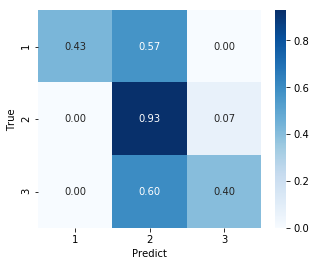

In [25]:
rf = RandomForestClassifier(criterion='entropy', n_estimators=500, max_features='sqrt', max_depth=None, random_state=1, n_jobs=-1)

scores = cross_val_score(estimator=rf, X=x_train_std, y=y_train, cv=10, n_jobs=-1)
print('CV accuracy scores: %s' % scores)
print('CV accuracy: %.3f +/- %.3f' % (np.mean(scores), np.std(scores)))

rf.fit(x_train_std, y_train)
pred = rf.predict(x_test_std)
print("Test : ",accuracy_score(pred, y_test))
heatmap(pred,y_test)

### Decision Tree

CV accuracy scores: [0.43478261 0.60869565 0.63636364 0.45454545 0.72727273 0.72727273
 0.72727273 0.36363636 0.63636364 0.45      ]
CV accuracy: 0.577 +/- 0.131
Test :  0.5384615384615384


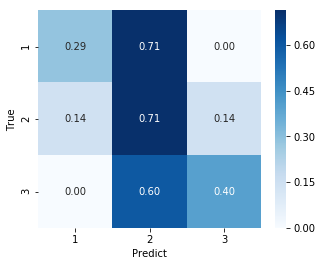

In [26]:
tree = DecisionTreeClassifier(criterion='entropy', max_depth=None, random_state=1)

scores = cross_val_score(estimator=tree, X=x_train_std, y=y_train, cv=10, n_jobs=-1)
print('CV accuracy scores: %s' % scores)
print('CV accuracy: %.3f +/- %.3f' % (np.mean(scores), np.std(scores)))

tree.fit(x_train_std, y_train)
pred = tree.predict(x_test_std)
print("Test : ",accuracy_score(pred,y_test))
heatmap(pred,y_test)

### Bagging

CV accuracy scores: [0.43478261 0.60869565 0.63636364 0.45454545 0.72727273 0.72727273
 0.72727273 0.36363636 0.63636364 0.45      ]
CV accuracy: 0.577 +/- 0.131
Test :  0.6153846153846154


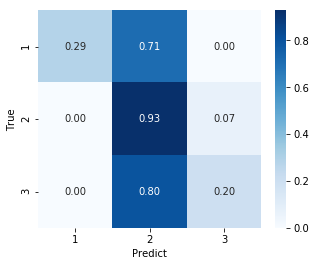

In [27]:
bag = BaggingClassifier(base_estimator=tree, n_estimators=500, max_samples=1.0,  max_features=1.0, bootstrap=True,
                        bootstrap_features=False, n_jobs=-1, random_state=1)

scores = cross_val_score(estimator=tree, X=x_train_std, y=y_train, cv=10, n_jobs=-1)
print('CV accuracy scores: %s' % scores)
print('CV accuracy: %.3f +/- %.3f' % (np.mean(scores), np.std(scores)))

bag.fit(x_train_std, y_train)
pred = bag.predict(x_test_std)
print("Test : ",accuracy_score(pred, y_test))
heatmap(pred,y_test)

### Ada Boost

CV accuracy scores: [0.47826087 0.52173913 0.59090909 0.5        0.63636364 0.72727273
 0.72727273 0.40909091 0.63636364 0.5       ]
CV accuracy: 0.573 +/- 0.103
Test :  0.5769230769230769


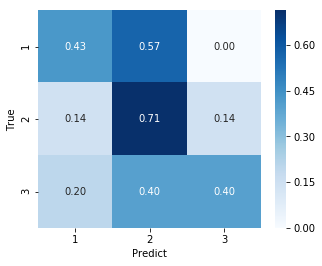

In [28]:
ada = AdaBoostClassifier(base_estimator=tree, n_estimators=500, learning_rate=0.1, random_state=0)

scores = cross_val_score(estimator=ada, X=x_train_std, y=y_train, cv=10, n_jobs=-1)
print('CV accuracy scores: %s' % scores)
print('CV accuracy: %.3f +/- %.3f' % (np.mean(scores), np.std(scores)))

ada.fit(x_train_std, y_train)
pred = ada.predict(x_test_std)
print("Test : ",accuracy_score(pred, y_test))
heatmap(pred,y_test)

## First result
- <b>Random Forest</b> was <b>best</b> classifier in prediction of <b>test</b> data set => <b>69%</b>
- But it is <b>not good</b> performance
- [2. 3. 2. 3. 2. 2. 2. 2. 2. 2. 2. 2. 2. 1. 1. 2. 2. 2. 2. 3. 1. 2. 2. 2. 2. 2.] => prediction of Random Forest
- [2. 3. 2. 2. 2. 3. 2. 2. 2. 2. 1. 2. 3. 1. 1. 2. 2. 1. 3. 3. 1. 2. 2. 1. 2. 1.] => labels
- It was <b>frequent</b> to <b>mis</b>classify <b>grade1</b> to <b>grade2</b>

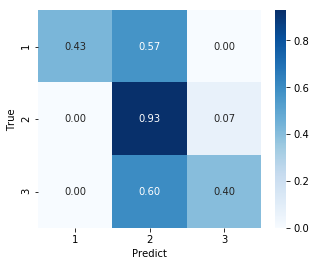

In [29]:
pred = [2, 3, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 3, 1, 2, 2, 2, 2, 2]
label = [2, 3, 2, 2, 2, 3, 2, 2, 2, 2, 1, 2, 3, 1, 1, 2, 2, 1, 3, 3, 1, 2, 2, 1, 2, 1]
heatmap(pred,label)

# 4. Improvement
## Solution : also use difference of means between grade1 and grade2
- We <b>just</b> used difference of <b>means</b> between <b>grade1</b> and <b>grade3</b>
- So, also use difference of <b>means</b> between <b>grade1</b> and <b>grade2</b>

## Remake 200 features(genes)
- Selete genes that difference of <b>means</b> between <b>grade1</b> and <b>grade2</b> is <b>lager</b> than <b>1/3</b> & <b>smaller</b> than <b>2/3</b> of difference of <b>means</b> between <b>grade1</b> and <b>grade3</b>
- => Select genes that mean of <b>grade2</b> has distance(<b>more 1/3</b>) from <b>grade1</b> & <b>grade3</b>

In [30]:
features = []
for i in diff_sort:
    if diff2[i] > diff[i]/3 and diff2[i] < 2*diff[i]/3:
        features.append(i)
    if len(features)==200:
        break

## Visualize again
- Visualize <b>new 200</b> genes
- <b>Means</b> of each grade got <b>more distinguishable</b>
- But real <b>distribution</b> of genes by grades <b>didn't</b> change <b>meaningfully</b>

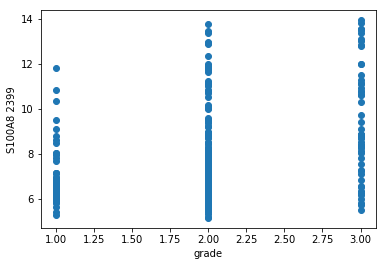

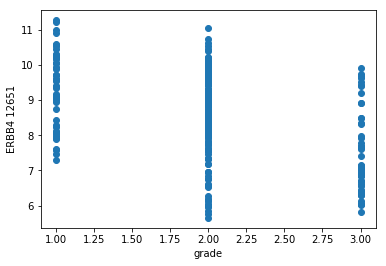

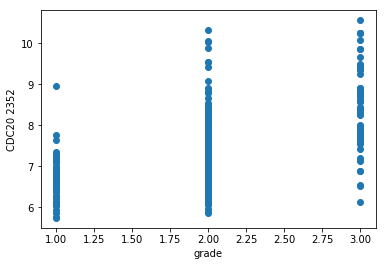

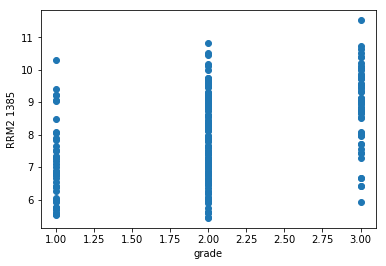

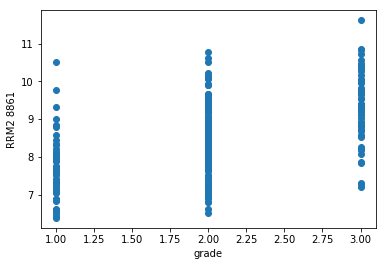

...

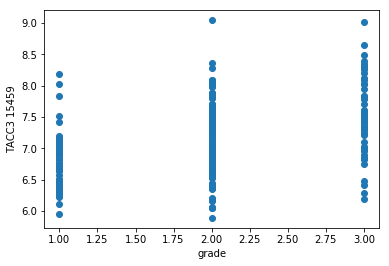

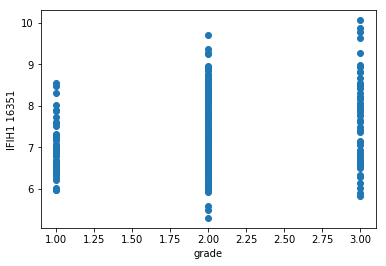

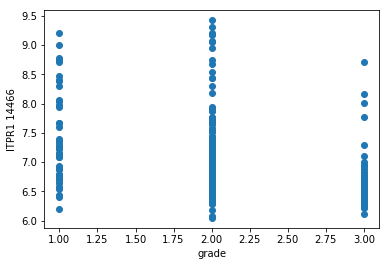

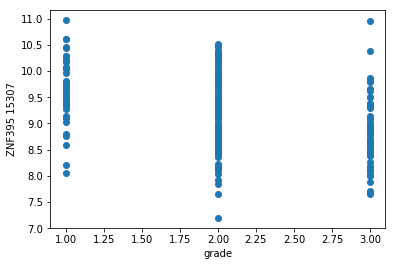

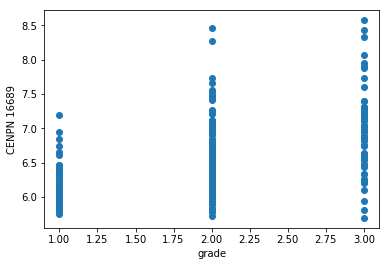

In [31]:
for i in features:
    plot(i)

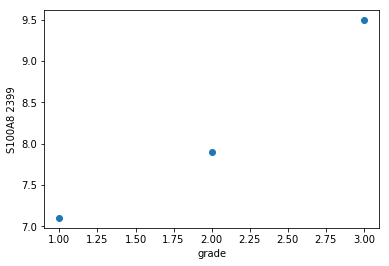

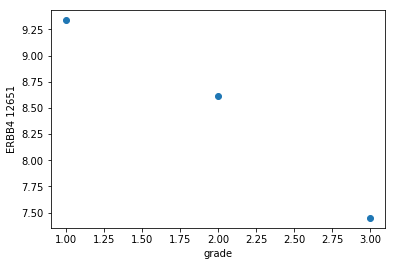

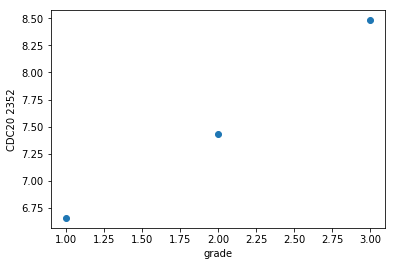

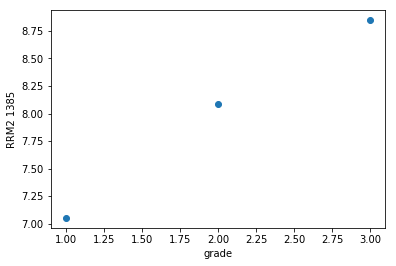

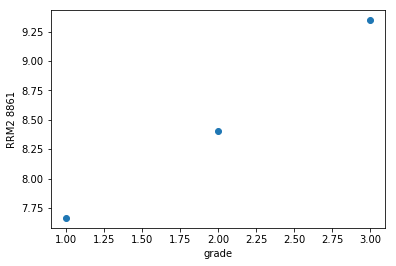

...

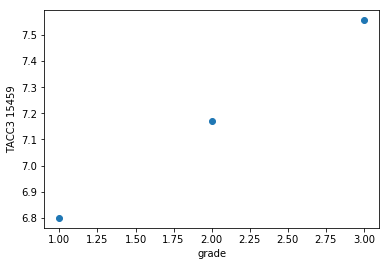

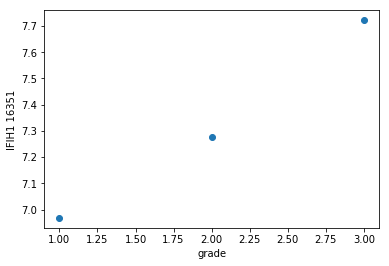

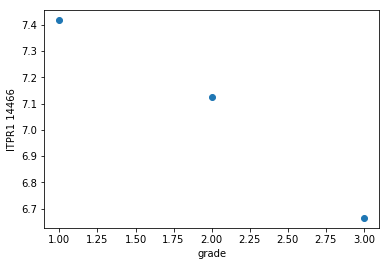

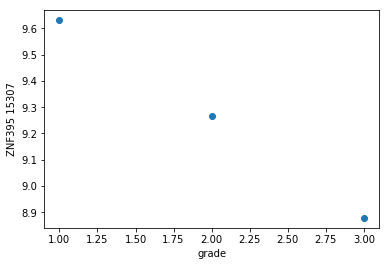

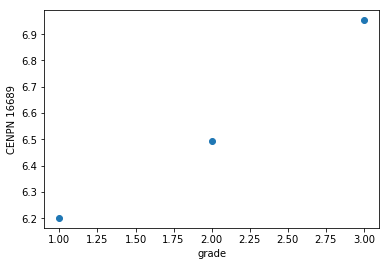

In [32]:
for i in features:
    plot_mean(i)

## Try classify again using new 200 features

In [33]:
data = []
for i in range(255):
    if not pd.isna(clinical['grade'][i]):
        arr = list(expr[expr.columns[i+1]][features])
        data.append(arr)

In [34]:
x_train = np.array(data[0:220])
y_train = np.array(labels[0:220])
x_test = np.array(data[220:])
y_test = np.array(labels[220:])

In [35]:
sc = StandardScaler()
sc.fit(x_train)
x_train_std = sc.transform(x_train)
x_test_std = sc.transform(x_test)

C:\Users\jeon\AppData\Local\Programs\Python\Python36-32\Lib\conda\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
C:\Users\jeon\AppData\Local\Programs\Python\Python36-32\Lib\conda\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\jeon\AppData\Local\Programs\Python\Python36-32\Lib\conda\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\jeon\AppData\Local\Programs\Python\Python36-32\Lib\conda\lib\site-packages\sklearn\linear_model\logistic.py:433: Future

Train :  0.5181818181818182
{'C': 0.1}
Test :  0.4230769230769231


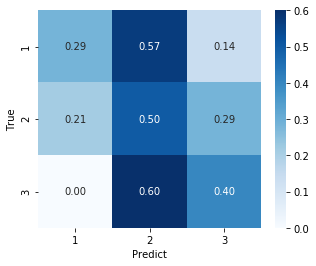

In [36]:
lr = LogisticRegression(random_state=1)
param_range = [0.001, 0.01, 0.1, 1.0, 10.0, 100.0 ,1000.0]
param_grid = [{'C': param_range}]
gs = GridSearchCV(estimator=lr, param_grid=param_grid, scoring='accuracy', cv=10, n_jobs=-1)
gs = gs.fit(x_train_std, y_train)

print("Train : ",gs.best_score_)
print(gs.best_params_)

lr = LogisticRegression(C=0.1, random_state=1)
lr.fit(x_train_std, y_train)
pred = lr.predict(x_test_std)
print("Test : ",accuracy_score(pred, y_test))
heatmap(pred,y_test)

C:\Users\jeon\AppData\Local\Programs\Python\Python36-32\Lib\conda\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Train :  0.6045454545454545
{'n_neighbors': 5}
Test :  0.5769230769230769


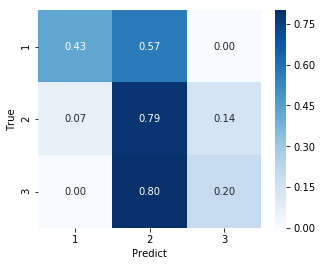

In [37]:
knn = KNeighborsClassifier()
param_range = [2, 3, 4, 5]
param_grid = [{'n_neighbors': param_range}]
gs = GridSearchCV(estimator=knn, param_grid=param_grid, scoring='accuracy', cv=10, n_jobs=-1)
gs = gs.fit(x_train_std, y_train)

print("Train : ",gs.best_score_)
print(gs.best_params_)

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(x_train_std, y_train)
pred = knn.predict(x_test_std)
print("Test : ",accuracy_score(pred, y_test))
heatmap(pred,y_test)

C:\Users\jeon\AppData\Local\Programs\Python\Python36-32\Lib\conda\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Train :  0.6636363636363637
{'C': 0.001, 'gamma': 0.1, 'kernel': 'poly'}
Test :  0.6153846153846154


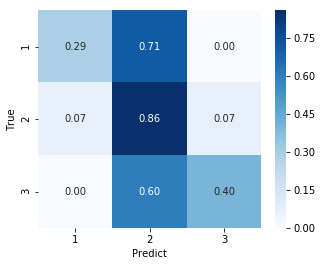

In [38]:
svm = SVC(random_state=1)
param_range = [0.001, 0.01, 0.1, 1.0, 10.0, 100.0 ,1000.0]
param_grid = [{'C': param_range, 'gamma': param_range, 'kernel': ['rbf']},
             {'C': param_range, 'kernel': ['poly'], 'gamma': param_range}]
gs = GridSearchCV(estimator=svm, param_grid=param_grid, scoring='accuracy', cv=10, n_jobs=-1)
gs = gs.fit(x_train_std, y_train)

print("Train : ",gs.best_score_)
print(gs.best_params_)

svm = SVC(kernel='poly', C=0.001, gamma=0.1, random_state=1)
svm.fit(x_train_std, y_train)
pred = svm.predict(x_test_std)
print("Test : ",accuracy_score(pred, y_test))
heatmap(pred,y_test)

CV accuracy scores: [0.65217391 0.65217391 0.72727273 0.59090909 0.77272727 0.63636364
 0.54545455 0.72727273 0.63636364 0.5       ]
CV accuracy: 0.644 +/- 0.080
Test :  0.6538461538461539


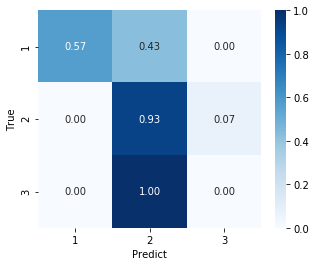

In [39]:
rf = RandomForestClassifier(criterion='entropy', n_estimators=500, max_features='sqrt', max_depth=None, random_state=1, n_jobs=-1)

scores = cross_val_score(estimator=rf, X=x_train_std, y=y_train, cv=10, n_jobs=-1)
print('CV accuracy scores: %s' % scores)
print('CV accuracy: %.3f +/- %.3f' % (np.mean(scores), np.std(scores)))

rf.fit(x_train_std, y_train)
pred = rf.predict(x_test_std)
print("Test : ",accuracy_score(pred, y_test))
heatmap(pred,y_test)

CV accuracy scores: [0.52173913 0.65217391 0.5        0.5        0.54545455 0.59090909
 0.68181818 0.59090909 0.5        0.35      ]
CV accuracy: 0.543 +/- 0.089
Test :  0.5384615384615384


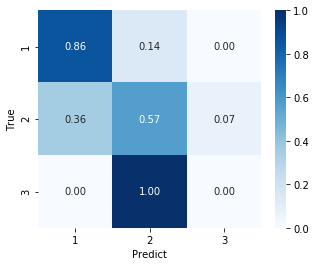

In [40]:
tree = DecisionTreeClassifier(criterion='entropy', max_depth=None, random_state=1)

scores = cross_val_score(estimator=tree, X=x_train_std, y=y_train, cv=10, n_jobs=-1)
print('CV accuracy scores: %s' % scores)
print('CV accuracy: %.3f +/- %.3f' % (np.mean(scores), np.std(scores)))

tree.fit(x_train_std, y_train)
pred = tree.predict(x_test_std)
print("Test : ",accuracy_score(pred,y_test))
heatmap(pred,y_test)

CV accuracy scores: [0.52173913 0.65217391 0.5        0.5        0.54545455 0.59090909
 0.68181818 0.59090909 0.5        0.35      ]
CV accuracy: 0.543 +/- 0.089
Test :  0.6153846153846154


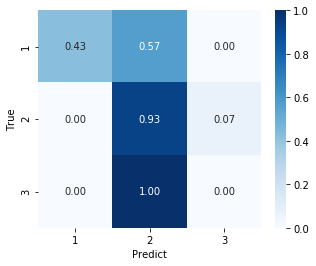

In [41]:
bag = BaggingClassifier(base_estimator=tree, n_estimators=500, max_samples=1.0,  max_features=1.0, bootstrap=True,
                        bootstrap_features=False, n_jobs=-1, random_state=1)

scores = cross_val_score(estimator=tree, X=x_train_std, y=y_train, cv=10, n_jobs=-1)
print('CV accuracy scores: %s' % scores)
print('CV accuracy: %.3f +/- %.3f' % (np.mean(scores), np.std(scores)))

bag.fit(x_train_std, y_train)
pred = bag.predict(x_test_std)
print("Test : ",accuracy_score(pred, y_test))
heatmap(pred,y_test)

CV accuracy scores: [0.39130435 0.56521739 0.45454545 0.59090909 0.54545455 0.5
 0.68181818 0.63636364 0.54545455 0.35      ]
CV accuracy: 0.526 +/- 0.099
Test :  0.5384615384615384


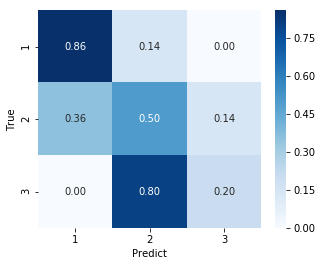

In [42]:
ada = AdaBoostClassifier(base_estimator=tree, n_estimators=500, learning_rate=0.1, random_state=0)

scores = cross_val_score(estimator=ada, X=x_train_std, y=y_train, cv=10, n_jobs=-1)
print('CV accuracy scores: %s' % scores)
print('CV accuracy: %.3f +/- %.3f' % (np.mean(scores), np.std(scores)))

ada.fit(x_train_std, y_train)
pred = ada.predict(x_test_std)
print("Test : ",accuracy_score(pred, y_test))
heatmap(pred,y_test)

## Second result
- <b>Random Forest</b> was <b>best</b> classifier in prediction of <b>test</b> data set => <b>65%</b>
- <b>New 200</b> features <b>decreased</b> accuracy in all classifiers
- [2. 2. 2. 3. 2. 2. 2. 2. 2. 2. 2. 2. 2. 1. 1. 2. 2. 2. 2. 2. 1. 2. 2. 2. 2. 1.] => prediction of Random Forest
- [2. 3. 2. 2. 2. 3. 2. 2. 2. 2. 1. 2. 3. 1. 1. 2. 2. 1. 3. 3. 1. 2. 2. 1. 2. 1.] => labels

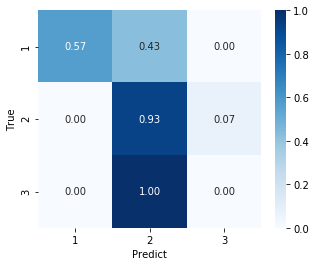

In [43]:
pred = [2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1]
label = [2, 3, 2, 2, 2, 3, 2, 2, 2, 2, 1, 2, 3, 1, 1, 2, 2, 1, 3, 3, 1, 2, 2, 1, 2, 1]
heatmap(pred,label)

# 5. Conclusion
## Features(genes)
- <b>New 200</b> features <b>worse</b> than first 200 features
- To Classify <b>grade1</b> and <b>grade2</b> is difficult <b>by means</b>
- So, <b>200</b> features <b>sorted</b> by difference of <b>means</b> between <b>grade1</b> and <b>grade3</b> are <b>best</b> features in my study

## List & histogram of interesting 200 genes

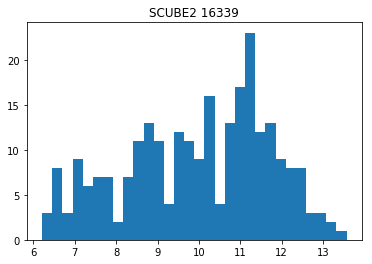

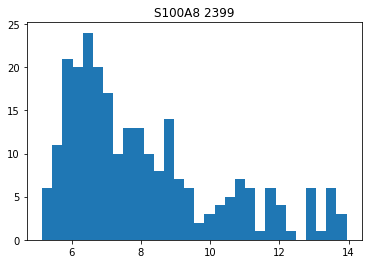

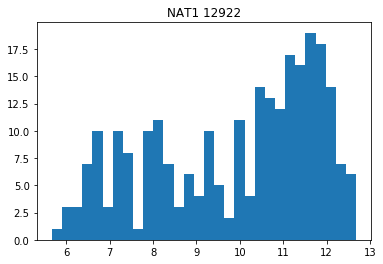

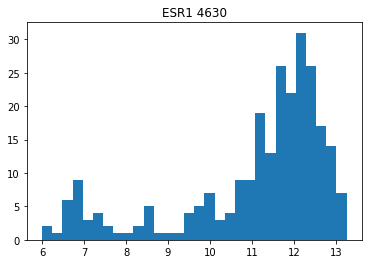

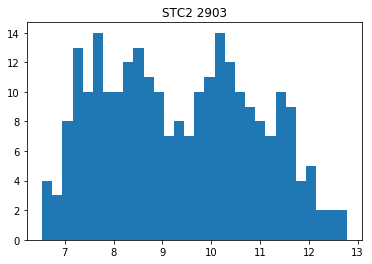

...

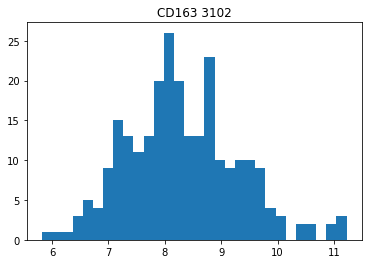

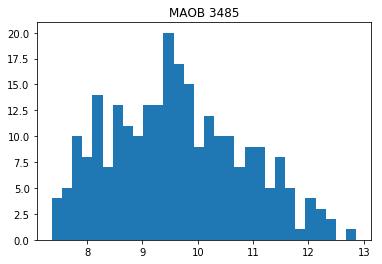

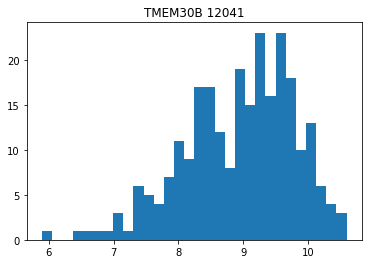

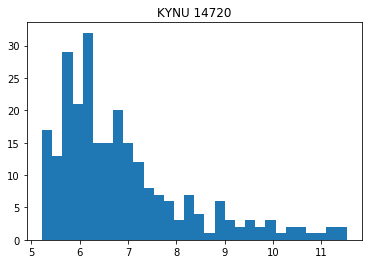

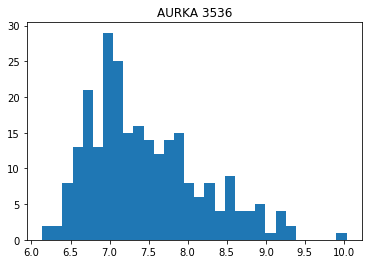

In [44]:
features = diff_sort[0:200]
for i in features:
    hist(i)

## Effective classifier
- <b>Best</b> Classifier was <b>Random Forest</b>
- Accuracy in <b>training</b> set (220 patients) using k-fold CV (k=10) was <b>63%</b>(+-<b>10%</b>)
- Accuracy in <b>test</b> set (26 patients) was <b>69%</b>

## Data set was so small
- Accuracy of classification was <b>not good</b>
- <b>Deviation</b> of accuracy in CV was <b>large</b>, because <b>training</b> data set was just <b>200</b> & <b>validation</b> data set was <b>20</b>
- If there is <b>more data</b> set, the <b>200 genes</b> will become more <b>meaningful</b> in classification models

# 6. Citation
## Citation of top 20 genes
- SCUBE2 : Lin YC, Lee YC, Li LH, Cheng CJ, Yang RB. J Cell Sci. 2014 Jan 1;127(Pt 1):85-100. doi: 10.1242/jcs.132779. Epub 2013 Nov 8.
<br><a href=https://www.ncbi.nlm.nih.gov/pubmed/24213532>https://www.ncbi.nlm.nih.gov/pubmed/24213532</a>
- S100A8 : Bao YI, Wang A, Mo J. S100A8/A9 is associated with estrogen receptor loss in breast cancer. Oncol Lett. 2016;11(3):1936-1942. 
<br><a href=https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4774479/>https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4774479/</a>
- NAT1 : Wakefield L, Robinson J, Long H, Ibbitt JC, Cooke S, Hurst HC, Sim E. Genes Chromosomes Cancer. 2008 Feb;47(2):118-26.
<br><a href=https://www.ncbi.nlm.nih.gov/pubmed/17973251>https://www.ncbi.nlm.nih.gov/pubmed/17973251</a>
- ESR1 : Clatot F, Augusto L, Di Fiore F. ESR1 mutations in breast cancer. Aging (Albany NY). 2017;9(1):3-4. 
<br><a href=https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5310651/>https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5310651/</a>
- STC2 : Hou J, Wang Z, Xu H, et al. Stanniocalicin 2 suppresses breast cancer cell migration and invasion via the PKC/claudin-1-mediated signaling. PLoS One. 2015;10(4):e0122179. Published 2015 Apr 1. doi:10.1371/journal.pone.0122179
<br><a href=https://www.ncbi.nlm.nih.gov/pubmed/25830567>https://www.ncbi.nlm.nih.gov/pubmed/25830567</a>
- ERBB4 : Sundvall M, Iljin K, Kilpinen S, Sara H, Kallioniemi OP, Elenius K. J Mammary Gland Biol Neoplasia. 2008 Jun;13(2):259-68. doi: 10.1007/s10911-008-9079-3. Epub 2008 May 3.
<br><a href=https://www.ncbi.nlm.nih.gov/pubmed/18454307>https://www.ncbi.nlm.nih.gov/pubmed/18454307</a>
- DNAJC12 : De Bessa SA1, Salaorni S, Patrao DF, Neto MM, Brentani MM, Nagai MA. Int J Mol Med. 2006 Feb;17(2):363-7.
<br><a href=https://www.ncbi.nlm.nih.gov/pubmed/16391838>https://www.ncbi.nlm.nih.gov/pubmed/16391838</a>
- CDC20 : Wang Z, Wan L, Zhong J, et al. Cdc20: a potential novel therapeutic target for cancer treatment. Curr Pharm Des. 2013;19(18):3210-4. 
<br><a href=https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4014638/>https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4014638/</a>
- RRM2 : Putluri N, Maity S, Kommagani R, et al. Pathway-centric integrative analysis identifies RRM2 as a prognostic marker in breast cancer associated with poor survival and tamoxifen resistance. Neoplasia. 2014;16(5):390-402. 
<br><a href=https://www.ncbi.nlm.nih.gov/pubmed/25016594>https://www.ncbi.nlm.nih.gov/pubmed/25016594</a>
- ABAT : Jansen MP, Sas L, Sieuwerts AM, et al. Decreased expression of ABAT and STC2 hallmarks ER-positive inflammatory breast cancer and endocrine therapy resistance in advanced disease. Mol Oncol. 2015;9(6):1218-33. 
<br><a href=https://www.ncbi.nlm.nih.gov/pubmed/25771305>https://www.ncbi.nlm.nih.gov/pubmed/25771305</a>
- GATA3 : Takaku M, Grimm SA, Wade PA. GATA3 in Breast Cancer: Tumor Suppressor or Oncogene?. Gene Expr. 2015;16(4):163-8. 
<br><a href=https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4758516/>https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4758516/</a>
- NPY1R : Liu L, Xu Q, Cheng L, et al. NPY1R is a novel peripheral blood marker predictive of metastasis and prognosis in breast cancer patients. Oncol Lett. 2014;9(2):891-896. 
<br><a href=https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4301529/>https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4301529/</a>
- MMP1 : Liu H, Kato Y, Erzinger SA, et al. The role of MMP-1 in breast cancer growth and metastasis to the brain in a xenograft model. BMC Cancer. 2012;12:583. Published 2012 Dec 7. doi:10.1186/1471-2407-12-583
<br><a href=https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3526403/>https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3526403/</a>
- ASPN : Castellana B, Escuin D, Peiro G, et al. ASPN and GJB2 Are Implicated in the Mechanisms of Invasion of Ductal Breast Carcinomas. J Cancer. 2012;3:175-83. 
<br><a href=https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3328783/>https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3328783/</a>
- BIRC5 : Hamy AS, Bieche I, Lehmann-Che J, Scott V, Bertheau P, Guinebretiere JM, Matthieu MC, Sigal-Zafrani B, Tembo O, Marty M, Asselain B, Spyratos F, de Cremoux P. Breast Cancer Res Treat. 2016 Oct;159(3):499-511. doi: 10.1007/s10549-016-3961-2. Epub 2016 Sep 3.
<br><a href=https://www.ncbi.nlm.nih.gov/pubmed/27592112>https://www.ncbi.nlm.nih.gov/pubmed/27592112</a>
- SLC1A1 : Hu H, Takano N, Xiang L, Gilkes DM, Luo W, Semenza GL. Hypoxia-inducible factors enhance glutamate signaling in cancer cells. Oncotarget. 2014;5(19):8853-68. 
<br><a href=https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4253402/>https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4253402/</a>
- CX3CR1 : Shen F, Zhang Y, Jernigan DL, et al. Novel Small-Molecule CX3CR1 Antagonist Impairs Metastatic Seeding and Colonization of Breast Cancer Cells. Mol Cancer Res. 2016;14(6):518-27. 
<br><a href=https://www.ncbi.nlm.nih.gov/pubmed/27001765>https://www.ncbi.nlm.nih.gov/pubmed/27001765</a>
- AGR2 : Fritzsche FR, Dahl E, Pahl S, Burkhardt M, Luo J, Mayordomo E, Gansukh T, Dankof A, Knuechel R, Denkert C, Winzer KJ, Dietel M, Kristiansen G.. Clin Cancer Res. 2006 Mar 15;12(6):1728-34.
<br><a href=https://www.ncbi.nlm.nih.gov/pubmed/16551856>https://www.ncbi.nlm.nih.gov/pubmed/16551856</a>
- S100A9 : Bergenfelz C, Gaber A, Allaoui R, et al. S100A9 expressed in ER(-)PgR(-) breast cancers induces inflammatory cytokines and is associated with an impaired overall survival. Br J Cancer. 2015;113(8):1234-43. 
<br><a href=https://www.ncbi.nlm.nih.gov/pubmed/26448179>https://www.ncbi.nlm.nih.gov/pubmed/26448179</a>
- MAPT : Ikeda H, Taira N, Hara F, et al. The estrogen receptor influences microtubule-associated protein tau (MAPT) expression and the selective estrogen receptor inhibitor fulvestrant downregulates MAPT and increases the sensitivity to taxane in breast cancer cells. Breast Cancer Res. 2010;12(3):R43. 
<br><a href=https://www.ncbi.nlm.nih.gov/pmc/articles/PMC2917038/>https://www.ncbi.nlm.nih.gov/pmc/articles/PMC2917038/</a>